# **Part I - MyAnimeList Dataset Exploration**
## **by Tevin Aduma**

## Introduction
> 
> Anime is a style of Japanese film and television animation, typically aimed at adults as well as children. More and more people have come out as anime fans from celebrities, politicians, sports personalities among many others enhancing the outlook of the *Otaku* (diehard anime fans) as that of "cool", so to speak.
>
> The anime industry was valued at over USD 24 Billion in 2020 projected to reach USD 43 Billion by 2027 with a growth rate of 8.80% over the forecast period. More on this can be [read here.](https://brandessenceresearch.com/technology-and-media/anime-market-size)
>
> Naturally, the term *anime* is attributed to Japan but other countries like China and South Korea have also ventured into the production of anime. This study, however, will focus only on Japanese anime productions, the studios that have produced these anime and a sample of viewers' sentiments towards these anime. 
>
> The end goal is to establish a baseline regarding the optimum niches each studio should focus on in order to ensure their releases are successful. 



## Preliminary Wrangling


In [2]:
# import all packages and set plots to be embedded inline
from wordcloud import WordCloud, STOPWORDS

import pandas as pd
import numpy as np
import re

#ensure all Plotly plots render while offline
import matplotlib.pyplot as plt
import seaborn as sb

from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objects as go
import plotly.express as px

init_notebook_mode(connected=True)

%matplotlib inline

### What is the structure of your dataset?

> This study entails two related datasets from MyAnimeList (**referred to as MAL in this document**). The initial dataset called `animes.csv` contains over 7000 records of anime productions made between 1992 and 2018 with over 10 features containing metadata for each anime. The second dataset named `reviews_cleaned.csv` includes viewer review data obtained from MyAnimeList with over 120,000 records with over 10 features entailing the viewers' comments, ratings and attitude regarding each anime. 
>
> These two datasets can be linked on the `title` feature. Here's a snippet of each dataset.
>  Anime Dataset            |  Viewer Reviews Dataset
>:-------------------------:|:-------------------------:
>![](img\animes_cleaned.png)   |  ![](img/reviews_cleaned.png)
> 
> This project focuses on actualizing and accentuating various data visualization techniques on the MAL datasets as part of Udacity's Data Analysis curriculum.

### What is/are the main feature(s) of interest in your dataset?

> The main features that I will be investigating are the **ranking scores** provided by `reviews_cleaned`  from the **Overall** score through to the **Character Development** score and how they are affected by various features obtained from the `animes_cleaned` dataset.

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

> From the `animes_cleaned` dataset, `genre`, `rating`, `season_released`, `source`, `studio`, and `type` will be fundamental in categorizing each record and figuring out how they affect the overall scores either provided by MAL or by each viewer review. These will be used to determine how the genre, rating, timing of release, source material, studio and release format affect each production's ranking.

> ### Loading the datasets

In [4]:
#custom function to read data into Pandas DataFrame
def open_set(csv, sep=',', encoding='utf-8', usecols=None):
    df = pd.read_csv('data/'+csv, low_memory=False, encoding=encoding)
    
    return df

In [5]:
df_animes = open_set('animes_cleaned.csv')
df_reviews = open_set('reviews_cleaned.csv', encoding='latin')

In [7]:
# This custom function is used to display frequency where fields are only in text format using the describe function
def describe_pretty(x):
    if type(x) == float:
        x = f'{x:.1f}'
    elif type(x) == str:
        x = x
    
    return x

In [8]:
for frame in [df_animes, df_reviews.iloc[:,0:11]]:
    display(frame.head(), frame.info(), frame.describe().applymap(lambda x: describe_pretty(x)))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7158 entries, 0 to 7157
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   anime_id         7158 non-null   int64  
 1   title            7158 non-null   object 
 2   genre            7158 non-null   object 
 3   studio           7158 non-null   object 
 4   season_released  7158 non-null   object 
 5   year_released    7158 non-null   int64  
 6   type             7158 non-null   object 
 7   source           7158 non-null   object 
 8   episodes         7158 non-null   int64  
 9   status           7158 non-null   object 
 10  rank             7158 non-null   int64  
 11  image_url        7157 non-null   object 
 12  rating           7158 non-null   object 
 13  score            7158 non-null   float64
 14  scored_by        7158 non-null   int64  
 15  score_rank       7158 non-null   float64
 16  popularity       7158 non-null   int64  
 17  popularity_ran

,anime_id,title,genre,studio,season_released,year_released,type,source,episodes,status,...,image_url,rating,score,scored_by,score_rank,popularity,popularity_rank,members,favorites,avg_rank_score
0,5114,Fullmetal Alchemist: Brotherhood,Action,Bones,Spring,2009,TV,Manga,64,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),9.25,733592,2.0,4,4.0,1199091,106895,3.0
1,9253,Steins;Gate,Thriller,White Fox,Spring,2011,TV,Visual novel,24,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,PG-13 - Teens 13 or older,9.14,563857,5.0,8,8.0,1010330,92423,6.5
2,1575,Code Geass: Hangyaku no Lelouch,Action,Sunrise,Fall,2006,TV,Original,25,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.79,627740,22.0,9,9.0,986897,63614,15.5
3,30276,One Punch Man,Action,Madhouse,Fall,2015,TV,Web manga,12,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.73,691845,27.0,5,5.0,1020754,30747,16.0
4,1535,Death Note,Mystery,Madhouse,Fall,2006,TV,Manga,37,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.67,1009477,31.0,1,1.0,1456378,88696,16.0


None

,anime_id,year_released,episodes,rank,score,scored_by,score_rank,popularity,popularity_rank,members,favorites,avg_rank_score
count,7158.0,7158.0,7158.0,7158.0,7158.0,7158.0,7158.0,7158.0,7158.0,7158.0,7158.0,7158.0
mean,15655.7,2009.1,12.2,3579.0,6.7,22267.6,218.3,4649.9,3057.5,44227.3,613.5,1637.9
std,12982.9,6.8,31.0,2066.5,1.2,58877.2,94.2,3487.5,1765.0,101546.2,3682.4,914.3
min,1.0,1992.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,16.0,0.0,3.0
25%,3078.5,2005.0,1.0,1790.0,6.3,555.0,154.0,1830.2,1550.2,1998.0,2.0,863.5
50%,11506.0,2011.0,4.0,3579.5,6.9,3328.0,210.0,3845.5,3031.5,9020.5,16.0,1621.8
75%,30190.0,2015.0,13.0,5368.0,7.4,17143.5,268.0,6858.8,4553.8,38315.0,115.0,2409.0
max,37916.0,2018.0,1818.0,7158.0,9.5,1009477.0,510.0,14456.0,6231.0,1456378.0,106895.0,3370.5


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125865 entries, 0 to 125864
Data columns (total 11 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   title                  125865 non-null  object 
 1   text                   125865 non-null  object 
 2   Overall                125865 non-null  float64
 3   Story                  125865 non-null  int64  
 4   Animation              125865 non-null  int64  
 5   Music                  125865 non-null  int64  
 6   Character Development  125865 non-null  int64  
 7   Enjoyment              125865 non-null  int64  
 8   polarity               125865 non-null  float64
 9   subjectivity           125865 non-null  float64
 10  attitude               125865 non-null  object 
dtypes: float64(3), int64(5), object(3)
memory usage: 10.6+ MB


,title,text,Overall,Story,Animation,Music,Character Development,Enjoyment,polarity,subjectivity,attitude
0,Made in Abyss,...,10.00,10,10,10,10,10,0.157887,0.571909,Positive
1,Made in Abyss,...,0.00,0,0,0,0,0,0.148182,0.615993,Positive
2,Made in Abyss,...,9.51,9,10,9,9,10,0.204097,0.521248,Positive
3,Made in Abyss,...,10.00,10,10,10,8,9,0.184405,0.610298,Positive
4,Made in Abyss,...,8.52,7,10,10,5,6,0.152582,0.520738,Positive


None

,Overall,Story,Animation,Music,Character Development,Enjoyment,polarity,subjectivity
count,125865.0,125865.0,125865.0,125865.0,125865.0,125865.0,125865.0,125865.0
mean,7.6,7.2,7.9,7.8,7.4,7.7,0.2,0.5
std,2.3,2.7,2.3,2.4,2.8,2.8,0.1,0.1
min,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0
25%,6.5,6.0,7.0,7.0,6.0,7.0,0.1,0.5
50%,8.0,8.0,8.0,8.0,8.0,9.0,0.2,0.5
75%,9.0,9.0,10.0,10.0,10.0,10.0,0.2,0.6
max,11.0,11.0,11.0,11.0,11.0,11.0,1.0,1.0


#### Inferences

> * From `df_animes`, the mean number of episodes per title is 12.2. This aligns with the norm in the anime industry where each cour/season usually consists of about 12 or 13 episodes.
>
> * From `df_reviews`, the **`Story`** score stands out as the lowest. This could attribute to the fact that the narrative of each title is probably the most important aspect while engaging with the show. 
> 
> * From `df_reviews`, the **`Animation`** score stands out as the highest. This could be due to technological advancements as the years progressed from the early 1990s into the late 2010s.
<hr>


> ## **Univariate Explorations**
> <hr>

>


### What has been the trend like in terms of anime production through the years?

> * First, I would like to investigate how production of titles has progressed through the years (1992 - 2018). Has there been a significant dip/upshoot or rather a steady decline/rise?

In [15]:
fig = px.line(df_animes.groupby(['year_released'])['title'].count().reset_index(),
        x='year_released', y='title',
        title='Yearly Anime Productions (1992 - 2018)',
        labels={'title':'Number of anime productions', 'year_released':'Year'}, orientation='v')
fig.update_layout(barmode='group', yaxis={'categoryorder':'total descending'})
fig.show()

#### Inferences

> * Compared to the 90s, the anime industry has seen a progressive increase in titles produced from the 2000s through to the 2010s. This attests to the growing popularity in anime as a form of media.
> 
> * The decline noticed between 2017 and 2018 is due to the fact that not all the titles produced in 2018 were included in the dataset as it was produced.
<hr>

### What studios have produced the most anime title between 1992 and 2018?

> I'd like to take a look at the major players in the anime industry by checking out the Top 10 anime studios based on the frequency of titles produced. 
>
> Note that some titles were developed by a collaboration of studios and so these collaborations will be attributed as one entitiy instead of separate studios.  

In [16]:
# I tally the appearance of each studio per record as an account of their involvement in the production of the record's title. 

fig = px.bar(df_animes.studio.value_counts().reset_index().rename(columns={'studio':'count', 'index':'studio'}).head(10),
        y='studio', x='count', text='studio', orientation='h',
        labels={'studio':'Anime Studios','count':'Number of anime produced'},
        title='Top 10 Studios Producing The Most Anime Between 1992-2018')
fig.update_yaxes(visible=False, showticklabels=False)
fig.update_layout(yaxis=dict(autorange="reversed"))

#### Inferences

> * **Toei Animation** and **Sunrise** lead the pack by a distance in terms of the titles they have churned out. This could speak to the success they have had in many of their releases: Toei with world renowed **One Piece** anime, Sunrise with the **Cowboy Bebop** series, the **Gundam franchise** to name a few.
<hr>

### Is there a disparity in terms of how titles are released through seasons?

> * Anime releases are usually classified based on the time of the year they are released i.e. Winter Anime (released between Nov and Jan), Spring Anime (Feb and April), Summer Anime (May and July) and Fall Anime (Aug and October).
> 
> * Could there be a inherrent reason as to why certain titles are successful and could this be attributed to their seasonal release period? This is one question I will be looking to answer through various imputations linked to the **`Vierwers' Reviews`** dataset.

In [17]:
fig = px.bar(df_animes['season_released'].value_counts().reset_index().rename(columns={'index':'season_released' ,'season_released':'count'}),
        x='season_released', y='count', text='count', title='Anime Released Per Season (1992-2018)',
        labels={'season_released':'Season Released','count':'Number of anime releases'},
        color_discrete_sequence=['black'])
fig.update_layout(barmode='group', yaxis={'categoryorder':'total descending'})
fig.update_yaxes(visible=False, showticklabels=False)
fig.show()

#### Inferences

> * Spring releases top the charts in terms of volume whereas Winter releases are the fewest of the lot.
<hr>

### What's the preferred release format for most adaptations?

In [18]:
fig = px.bar(df_animes['type'].value_counts().reset_index().rename(columns={'index':'type' ,'type':'count'}),
        x='type', y='count', text='count', title='Preferred Release Formats for Anime Productions (1992-2018)',
        labels={'type':'Release Format','count':'Number of anime releases'},
        color_discrete_sequence=['black'])
fig.update_layout(barmode='group', yaxis={'categoryorder':'total descending'})
fig.update_yaxes(visible=False, showticklabels=False)
fig.show()

#### Inferences

> * As seen, TV releases are the most preferred method among the various release formats. This could be due to ease of accessibility for most viewers and pre-planned programme schedules with stations like NHK, MBS, Toonami etc
>
> * Original Net Animation (ONA) format is a relatively new outlet for animation distribution that has been made viable by the increasing number of streaming media websites in Japan hence it's low numbers.
<hr>

### How varied are is distribution of anime adaptations by material they were sourced from?

In [19]:
fig = px.bar(df_animes['source'].value_counts().reset_index().rename(columns={'index':'source' ,'source':'count'}),
        x='source', y='count', text='count', title='Anime Releases Per Source Material (1992-2018)',
        labels={'source':'Source Material','count':'Number of anime releases'},
        color_discrete_sequence=['black'])
fig.update_layout(barmode='group', yaxis={'categoryorder':'total descending'})
fig.update_yaxes(visible=False, showticklabels=False)
fig.show()

#### Inferences

> * As expected, the most preferred source material for anime is [manga](https://en.wikipedia.org/wiki/Manga), Japanese comics or graphic novels. As explained in [this Quora post](https://www.quora.com/Why-do-you-prefer-manga-over-comics), "there's more depth in manga compared to original works".
>
> * A lot of anime originals have also been spurned in the time period notably movies like Kimi na no Wa, majority of Studio Ghibli movies etc.
<hr>

### Visualization of the Distribution of titles per Viewer Rating over the years

In [20]:
fig = px.bar(df_animes['rating'].value_counts().reset_index().rename(columns={'index':'rating' ,'rating':'count'}),
        x='rating', y='count', text='count', title='Anime Releases Per Viewer Rating (1992-2018)',
        labels={'rating':'Rating','count':'Number of anime releases'},
        color_discrete_sequence=['black'])
fig.update_layout(barmode='group', yaxis={'categoryorder':'total descending'})
fig.update_yaxes(visible=False, showticklabels=False)
fig.show()

#### Inferences

> * The volume of PG-13 rated anime indicates the growing trend in the production of content with stronger language, extended violence or sexual situations and drug-use. This article by the [LA Times in 1997](https://www.latimes.com/archives/la-xpm-1997-oct-07-ca-40000-story.html) clearly depicts how the trend picked up as time went by.
>
> * There are very few R-rated anime titles indicating the anime demographic is intended for Children to Young Adults.
<hr>

>### What factors heavily influence successful anime from the late 20th century into the early 21st century?
> **Note:** Taking into consideration that some anime (if _not all anime_) have been produced by a collaboration of major studios and minor studios, records of such collaborations will be tabulated as one entity and attribute each studio's work as their own. 
> 
> First, let's take a look at the what have been ranked as the top 100 anime of based on the considered timeframe and investigate the frequency of certain factors from the sample size.

In [21]:
# create a dataframe of animes with the top 100 smallest avg_rank
top100_anime = df_animes.nsmallest(100,'avg_rank_score')
top100_anime

,anime_id,title,genre,studio,season_released,year_released,type,source,episodes,status,...,image_url,rating,score,scored_by,score_rank,popularity,popularity_rank,members,favorites,avg_rank_score
0,5114,Fullmetal Alchemist: Brotherhood,Action,Bones,Spring,2009,TV,Manga,64,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),9.25,733592,2.0,4,4.0,1199091,106895,3.0
1,9253,Steins;Gate,Thriller,White Fox,Spring,2011,TV,Visual novel,24,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,PG-13 - Teens 13 or older,9.14,563857,5.0,8,8.0,1010330,92423,6.5
2,1575,Code Geass: Hangyaku no Lelouch,Action,Sunrise,Fall,2006,TV,Original,25,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.79,627740,22.0,9,9.0,986897,63614,15.5
3,30276,One Punch Man,Action,Madhouse,Fall,2015,TV,Web manga,12,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.73,691845,27.0,5,5.0,1020754,30747,16.0
4,1535,Death Note,Mystery,Madhouse,Fall,2006,TV,Manga,37,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.67,1009477,31.0,1,1.0,1456378,88696,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,934,Higurashi no Naku Koro ni,Mystery,Studio Deen,Spring,2006,TV,Visual novel,26,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.10,221985,86.0,97,94.0,452086,15819,90.0
96,34599,Made in Abyss,Sci-Fi,Kinema Citrus,Summer,2017,TV,Web manga,13,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.91,166905,15.0,178,166.0,326011,11817,90.5
97,1482,D.Gray-man,Action,TMS Entertainment,Fall,2006,TV,Manga,103,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,PG-13 - Teens 13 or older,8.16,171370,80.0,106,102.0,423475,12129,91.0
98,18153,Kyoukai no Kanata,Slice of Life,Kyoto Animation,Fall,2013,TV,Light novel,12,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,PG-13 - Teens 13 or older,7.87,261632,109.0,75,73.0,518214,7745,91.0


In [22]:
factors = [ 'studio', 'genre', 'rating','type', 'source', 'season_released','year_released']

def value_counter(df):
    for factor in factors:
        display(df[factor].value_counts().to_frame().head(10))

value_counter(top100_anime)

,studio
Bones,10
Madhouse,10
A-1 Pictures,9
Kyoto Animation,8
J.C.Staff,6
Studio Pierrot,5
Production I.G,5
Sunrise,4
White Fox,4
Brain&#039;s Base,3


,genre
Action,53
Comedy,10
Slice of Life,9
Mystery,6
Adventure,6
Drama,5
Sci-Fi,3
Game,2
Ecchi,2
Thriller,1


,rating
PG-13 - Teens 13 or older,58
R - 17+ (violence & profanity),34
R+ - Mild Nudity,4
PG - Children,3
G - All Ages,1


,type
TV,92
Movie,7
OVA,1


,source
Manga,45
Original,20
Light novel,18
Novel,9
Visual novel,5
Web manga,3


,season_released
Fall,35
Spring,33
Summer,19
Winter,13


,year_released
2006,11
2012,11
2014,10
2015,9
2016,9
2011,9
2008,6
2013,6
2007,5
2004,5


#### Inferences:

> * Studio Bones, Madhouse, A-1 Pictures, Kyoto Animation (KyoAni ♥) and J.C. Staff have had the more number of releases in the last 3 decades compared to the rest of the pack.   
>
> * The **Action** genre is by a mile the most popular genre among titles in the anime industry.
>
> * TV releases have been by far the popular medium of release in the anime industry.
>
> * **Manga** and **Original** sourced anime are the lead runners in terms of adaptations of titles in the industry.
>
> * **Fall** and **Spring** anime seem to be the most popular among viewers based on the MAL anime dataset.
>
> * Despite their scarcity in numbers compared to anime rated PG-13, titles rated R-17+ seem to quite popular in the anime industry. This could indicate a need for anime with more adult-related themes.

> ## **Bivariate Exploration**
> <hr>

> In this section, investigate relationships between pairs of variables in your
data. Make sure the variables that you cover here have been introduced in some
fashion in the previous section (univariate exploration).

### In what format do various anime source materials get adapted into?

In [23]:
# aggregating the data by grouping it by the release format and source material
df_agg = df_animes.groupby(['type', 'source'])['title'].count().to_frame()
df_agg = df_agg['title'].groupby('type', group_keys=False).nlargest(5).reset_index()
df_agg.type = df_agg.type.astype('category')


fig = px.bar(df_agg,
        x='source', y='title', color='type',
        title='Anime Adaptations by Release Format and Source Material (1992-2018)',
        labels={'type':'Release Format', 'source':'Source Material', 'title': 'Total Adaptations'})
fig.update_layout(barmode='group', yaxis={'categoryorder':'total descending'})
fig.show()

#### Inferences

> * A variety of manga are majorly adapated into TV releases or OVAs [(Original Video Animation)](https://en.wikipedia.org/wiki/Original_video_animation)
>
> * Movie anime releases are *more likely* to be originals than works adapted from manga or other media formats.
>
> * OVAs are the main adaptation outlet of visual novels. This is because most visual novels are are just hard to adapt. Most of the dialogue in any visual novel is internal and wouldn't translate very well into a visual medium like TV anime since they can range anywhere from ten hours to complete.
<hr>

In [24]:
df_animes.dtypes

anime_id             int64
title               object
genre               object
studio              object
season_released     object
year_released        int64
type                object
source              object
episodes             int64
status              object
rank                 int64
image_url           object
rating              object
score              float64
scored_by            int64
score_rank         float64
popularity           int64
popularity_rank    float64
members              int64
favorites            int64
avg_rank_score     float64
dtype: object

In [25]:
cols_to_exclude = ['title', 'episodes', 'rank', 'image_url',
         
                    'score', 'score_rank', 'popularity', 'popularity_rank', 'members','favorites', 'avg_rank_score' ]
def categorizer(df, col_to_order = None, order=False):
    for col in df.columns:
        if df[col].nunique() < 600 and col not in cols_to_exclude:
            df[col] = df[col].astype('category')
    if order == True:
        df[col_to_order] = df[col_to_order].cat.reorder_categories(df[col_to_order].unique(),True)
    
    return df

df_animes = categorizer(df_animes, 'year_released', True)
df_animes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7158 entries, 0 to 7157
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   anime_id         7158 non-null   int64   
 1   title            7158 non-null   object  
 2   genre            7158 non-null   category
 3   studio           7158 non-null   object  
 4   season_released  7158 non-null   category
 5   year_released    7158 non-null   category
 6   type             7158 non-null   category
 7   source           7158 non-null   category
 8   episodes         7158 non-null   int64   
 9   status           7158 non-null   category
 10  rank             7158 non-null   int64   
 11  image_url        7157 non-null   object  
 12  rating           7158 non-null   category
 13  score            7158 non-null   float64 
 14  scored_by        7158 non-null   int64   
 15  score_rank       7158 non-null   float64 
 16  popularity       7158 non-null   int64   


In [26]:
df_agg = df_animes[['studio', 'genre']].value_counts().reset_index().rename(columns={0:'count'}).head(50)
df_agg.info()
fig = px.bar(df_agg, x='studio', y='count', color='genre', labels={'count':'Number of titles produced', 'genre':'Genre', 'studio':'Studio'},
title='Distribution of Titles and Genres Produced by Various Studios')
fig.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   studio  50 non-null     object  
 1   genre   50 non-null     category
 2   count   50 non-null     int64   
dtypes: category(1), int64(1), object(1)
memory usage: 2.3+ KB


#### Inferences

> * There is a clear indicator that a lot of studios do produce many **Action**, **Adventure** and **Comedy** titles compared to other genres.
>
> * Kyoto Animation's model clearly revolves around **Slice of Life** and **Comedy** anime depicting their success with anime such as Violet Evergarden, Miss Kobayashi etc
<hr>

### What has been the trend in source material adaptation through the years (1992-2018)?

In [38]:
df_agg = df_animes.groupby(['year_released', 'source', 'type'])['title'].count().to_frame()
df_agg = df_agg['title'].groupby('year_released', group_keys=False).nlargest(5).reset_index()
df_agg.year_released = df_agg.year_released.astype('category')
df_agg.source = df_agg.source.astype('category')


fig = px.line(df_agg,
        x='year_released', y='title', color='source',
        title='Anime Adaptation Sources (1992-2018)',
        labels={'title':'Total adaptations made', 'year_released':'Year Released', 'source':'Source(s)'}, symbol='type',
        height=1000)
fig.update_layout(barmode='group', yaxis={'categoryorder':'total descending'})
fig.show()

#### Inferences

> * Manga adaptations have been on the rise since the 90s. They are bar the most popular source material for anime adaptations.
>
> * Original adaptations have also been on the rise seeing as there was a steep increase in their number between 2013 and 2015 seeing them topple Manga adaptations in the latter year. This could be attributed to the critical acclaim and success in 2013 releases such as The Tale of Princess Kaguya by Studio Ghibli, The Garden of Words by renowed director Makoto Shinkai and CoMix Wave Film, 2014 releases such as Evangelion: Final, The Last Naruto Movie, Detective Conan: Dimensional Sniper and 2015 releases such as Tafuu no Norada, Psycho-Pass: The Movie and many others.  
>
>
> * Suprisingly, there have been few manga-movie adaptations in the past three decades. This could be due to the fact that while many popular movies are original creative works intended to convey their thematic messages in a sitting, it's much easier to condense manga into TV adaptations spanning over a period of times.
>
> * Adaptations of Light Novels and Visual Novels have struggled to hit the highs of Manga-sourced and Originals anime titles.
<hr>

### What are some of the key features that can be attibuted of all anime titles based on averages of their producing studios?

In [29]:
df_stds = df_animes.copy()
df_stds[['season_released', 'year_released']] = df_stds[['season_released', 'year_released']].astype('str')
studios_avgs = df_stds.groupby('studio').mean().reset_index()
display(studios_avgs, studios_avgs.describe())

,studio,anime_id,episodes,rank,score,scored_by,score_rank,popularity,popularity_rank,members,favorites,avg_rank_score
0,10Gauge,33792.500000,6.500000,6157.250000,5.525000,349.250000,338.250000,9918.500000,5282.500000,1322.750000,1.500000,2810.375000
1,2:10 Animation,37029.666667,9.333333,6046.666667,4.176667,124.000000,349.666667,8773.000000,5125.333333,1136.333333,2.000000,2737.500000
2,33 Collective,37428.000000,0.000000,7158.000000,0.000000,0.000000,510.000000,14456.000000,6231.000000,21.000000,0.000000,3370.500000
3,8bit,24951.676471,7.558824,2160.294118,6.662647,38130.823529,207.029412,2325.088235,1816.588235,75684.117647,345.882353,1011.808824
4,A-1 Pictures,22196.825581,10.034884,2261.569767,7.077093,55898.081395,181.552326,2694.110465,1934.395349,106915.976744,1626.209302,1057.973837
...,...,...,...,...,...,...,...,...,...,...,...,...
686,"ixtl, LIDENFILMS",30806.000000,12.000000,1200.000000,6.930000,26434.000000,203.000000,1163.000000,1001.000000,70801.000000,254.000000,602.000000
687,pH Studio,36716.000000,1.000000,6990.000000,6.060000,51.000000,290.000000,13320.000000,6138.000000,84.000000,0.000000,3214.000000
688,production doA,34773.000000,6.500000,2335.500000,6.990000,4299.000000,197.000000,2430.000000,1974.500000,34213.500000,72.000000,1085.750000
689,ufotable,13914.392857,4.553571,2454.535714,7.195714,42798.767857,176.035714,2776.142857,2102.678571,80084.232143,994.107143,1139.357143


,anime_id,episodes,rank,score,scored_by,score_rank,popularity,popularity_rank,members,favorites,avg_rank_score
count,691.000000,691.000000,691.000000,691.000000,691.000000,691.000000,691.000000,691.000000,691.000000,691.000000,691.000000
mean,17719.567590,12.717311,4000.770012,6.437043,13241.434748,244.913730,5324.922285,3405.646170,28275.172796,338.364375,1825.279950
std,13067.319947,19.526138,1762.484791,1.035811,27504.316713,81.003575,3285.203642,1519.209857,51696.868020,1809.232774,786.113295
min,30.000000,0.000000,42.000000,0.000000,0.000000,35.500000,48.000000,47.000000,16.000000,0.000000,55.500000
25%,4708.000000,2.375000,2607.000000,6.030000,563.666667,190.330357,2828.500000,2208.000000,2125.000000,4.000000,1204.166667
50%,15677.746479,8.593750,3927.000000,6.600000,3672.166667,234.000000,4532.000000,3324.000000,10255.000000,28.000000,1781.907407
75%,31563.500000,13.000000,5479.500000,7.046500,14276.741379,289.333333,7221.000000,4661.095361,32239.333333,146.550000,2463.333333
max,37790.000000,258.000000,7158.000000,8.615000,364012.000000,510.000000,14456.000000,6231.000000,641101.000000,41098.000000,3370.500000


#### Inferences
> 1. On average, most studios releases constitute 12 episodes per cour/season. This is the widely accepted notion in the anime community.
> 
> 1. With a mean 6.43, it's true to say that based on MAL **scores**, viewers have been **content** with the anime titles churned out from the early 90s till 2018.  
>

In [30]:
studios_avgs.query('avg_rank_score == avg_rank_score.min()')

,studio,anime_id,episodes,rank,score,scored_by,score_rank,popularity,popularity_rank,members,favorites,avg_rank_score
176,"Gainax, Tatsunoko Production",30.0,26.0,42.0,8.32,364012.0,64.0,48.0,47.0,641101.0,41098.0,55.5


Studio Gainax's and Tatsunoko Productions's work is highly rated on average amongst the anime community with this being world-renowed **Neon Genesis Evangelion**. 

In [31]:
df_animes.query('title == "Neon Genesis Evangelion"').genre

42    Action
Name: genre, dtype: category
Categories (39, object): ['Action', 'Adventure', 'Cars', 'Comedy', ..., 'Super Power', 'Supernatural', 'Thriller', 'Yaoi']

> * This was an **original TV** anime  released in the **Fall**. It's main genre was **Action** and had a rating of **PG-13**.

In [32]:
studios_avgs.nsmallest(20,'avg_rank_score')

,studio,anime_id,episodes,rank,score,scored_by,score_rank,popularity,popularity_rank,members,favorites,avg_rank_score
176,"Gainax, Tatsunoko Production",30.000000,26.000000,42.000000,8.320000,364012.0,64.000000,48.0,47.0,641101.000000,41098.000000,55.500000
297,"Madhouse, Satelight, Graphinica",777.000000,10.000000,67.000000,8.530000,221939.0,43.000000,105.0,101.0,425255.000000,13450.000000,72.000000
482,"Silver Link., Nexus",30296.000000,12.000000,188.000000,7.750000,193030.0,121.000000,168.0,158.0,336877.000000,4087.000000,139.500000
9,"A-1 Pictures, Trigger, CloverWorks",35849.000000,24.000000,200.000000,8.170000,76973.0,79.000000,239.0,219.0,276912.000000,4991.000000,149.000000
269,"Kyoto Animation, Animation Do",20386.000000,12.500000,275.500000,7.720000,155257.5,124.000000,264.0,239.0,277420.500000,5126.000000,181.500000
618,"Tezuka Productions, MAPPA",12531.000000,12.000000,303.000000,8.440000,93986.0,52.000000,390.0,349.0,192993.000000,4600.000000,200.500000
172,"Gainax, Production I.G",96.666667,2.666667,323.666667,8.016667,165267.0,94.333333,344.0,309.0,274696.666667,8161.333333,201.666667
208,"Hal Film Maker, TYO Animations",7817.000000,12.000000,357.000000,7.100000,142827.0,186.000000,285.0,257.0,244791.000000,1641.000000,221.500000
371,"Ordet, SANZIGEN",11285.000000,8.000000,370.000000,7.000000,125060.0,196.000000,283.0,256.0,245436.000000,1852.000000,226.000000
663,"Xebec, Asread",79.000000,24.000000,434.000000,7.240000,97057.0,172.000000,395.0,354.0,190780.000000,1482.000000,263.000000


#### Inferences

> * Notably, a few studios make more than one entry in the highly-ranked sample size we've obtained. They are:
>   
>   1. **Madhouse**, responsible for a lot of popular anime like Death Note, Hunter x Hunter, ACCA-13, the first season of One Punch Man
>
>   2. **Studio Gainax**, responsible for what is probably the most widely known sci-fi anime in Neon Genesis Evangelion, FLCL, Gurren Lagann among other popular shows.
>
>   3. **Studio Satelight**, known for assistance in several anime productions, has brought to life shows like Fairy Tail (a popular anime in the Shounen spectrum), Log Horizon 

### On that note, what studio(s) have made some of the Top 100 popular relases among anime fans in the last 2 decades?

In [33]:
fav_studios = (list(studios_avgs.nlargest(100,'favorites').studio))
fstudios = []
for item in fav_studios:    
    studio = item.split(',')
    fstudios.append(studio)

from itertools import chain
my_unnested_list = set(chain(*fstudios))
print(my_unnested_list)

{'Silver Link.', 'GoHands', 'MAPPA', ' Trans Arts', ' C2C', 'Bones', 'Khara', 'Radix', ' TROYCA', 'Shaft', ' Tatsunoko Production', 'Sugar Boy', 'NUT', 'Studio Ghibli', 'Triangle Staff', 'AIC Build', ' Graphinica', 'AIC Spirits', 'Kinema Citrus', ' J.C.Staff', 'Wit Studio', 'Bandai Namco Pictures', ' Studio Hibari', ' A-1 Pictures', 'Lerche', 'David Production', ' Ascension', 'Square Enix', ' TYO Animations', 'Pierrot Plus', 'Asread', 'Gainax', ' Studio Gokumi', 'Studio Pierrot', 'Bee Train', 'AIC Plus+', ' Kinema Citrus', ' Purple Cow Studio Japan', ' Trigger', ' Madhouse', ' AIC', 'Sunrise', 'Hal Film Maker', ' Imagin', ' SynergySP', 'Tezuka Productions', 'Studio Rikka', ' Studio Deen', ' Animation Do', 'P.A. Works', ' Nexus', 'Satelight', ' Minami Machi Bugyousho', ' Studio 3Hz', ' Connect', ' Platinum Vision', 'J.C.Staff', ' Encourage Films', 'Orange', ' Nakamura Production', 'AIC A.S.T.A.', 'feel.', 'Kyoto Animation', ' Marvy Jack', 'Doga Kobo', 'Studio Chizu', ' SANZIGEN', 'Xebec

#### Inferences

> * Notable studios in this list based on current trends include MAPPA, A-1 Pictures, Studio Khara, White Fox, Madhouse, Studio Deen, Sunrise, Brain's Base, J.C. Staff, CoMix Wave Films, Studio NUT, Bones, Studio Trigger, Ufotable, Egg Firm, Wit Studio, Lerche, Kinema Citrus, Silver Link, Production I.G, Kyoto Animation, Studio Pierrot, Gainax, Cloverworks, Studio Ghibli, Shaft, TROYCA, and White Fox.
> 
> * **My intention is to do an in-depth study of these studios with updated figures from the last 5 years esp how trends might have shifted through the COVID era**

> **How have the seasons varied in rank?**

In [34]:
seasons  = df_animes.groupby('season_released')[['score', 'favorites', 'members', 'avg_rank_score']].mean()
display(seasons, seasons.members.nlargest(10), seasons.favorites.nlargest(10), seasons.score.nlargest(10), seasons.avg_rank_score.nsmallest(10))

,score,favorites,members,avg_rank_score
season_released,,,,
Fall,6.780988,867.417181,51165.644020,1569.063448
Spring,6.738144,707.360781,43743.274155,1676.854831
Summer,6.533466,440.235434,42177.652200,1663.290428
Winter,6.806148,388.853199,39275.675659,1636.726161


season_released
Fall      51165.644020
Spring    43743.274155
Summer    42177.652200
Winter    39275.675659
Name: members, dtype: float64

season_released
Fall      867.417181
Spring    707.360781
Summer    440.235434
Winter    388.853199
Name: favorites, dtype: float64

season_released
Winter    6.806148
Fall      6.780988
Spring    6.738144
Summer    6.533466
Name: score, dtype: float64

season_released
Fall      1569.063448
Winter    1636.726161
Summer    1663.290428
Spring    1676.854831
Name: avg_rank_score, dtype: float64

#### Inferences
> * Undisputedly, **Fall anime have been the most succesful releases among the anime community the past in 20 years**. This speaks volumes as to why certain fan-favorite reboots and long-awaited releases like Bleach, Chainsaw Man, Jujutsu Kaisen among others are set for release in the Fall period.
>
> * This could also attribute to changes in the 2-cour system where anime is released in two parts through seperate seasons. There could be an emergence of anime being released through Summer into the Fall periods causing a boost in Summer releases. One anime using this format in 2022 is Spy x Family.

### How have releases of each genre progressed over the years (1992-2018)?

In [35]:
df_agg = df_animes.groupby(['year_released', 'genre'])['title'].count().to_frame()
df_agg = df_agg['title'].groupby('year_released', group_keys=False).nlargest(5).reset_index()
df_agg.year_released = df_agg.year_released.astype('category')
display(df_agg.head(20), df_agg.tail(20))

,year_released,genre,title
0,1992,Action,32
1,1992,Adventure,15
2,1992,Comedy,14
3,1992,Drama,7
4,1992,Kids,4
5,1993,Action,32
6,1993,Comedy,13
7,1993,Adventure,11
8,1993,Drama,11
9,1993,Fantasy,4


,year_released,genre,title
115,2015,Action,148
116,2015,Comedy,148
117,2015,Slice of Life,48
118,2015,Hentai,30
119,2015,Music,28
120,2016,Action,160
121,2016,Comedy,127
122,2016,Slice of Life,58
123,2016,Music,40
124,2016,Adventure,29


In [36]:
fig = px.line(df_agg,
        x='year_released', y='title', color='genre', text='title',
        title='Anime Productions by Genre (Top 20)',
        labels={'genre':'Genre', 'title':'Number of anime', 'studio':'Anime Studios', 'year_released':'Year Released'},
        color_discrete_sequence=['rgb(127, 60, 141)', 'rgb(17, 165, 121)', 'rgb(57, 105, 172)',
        'rgb(242, 183, 1)', 'rgb(231, 63, 116)', 'rgb(128, 186, 90)', 'rgb(230, 131, 16)', 'rgb(0, 134, 149)',
        'rgb(207, 28, 144)', 'rgb(249, 123, 114)', 'rgb(165, 170, 153)', 'rgb(0,34,86,40)'],
        orientation='v')
fig.update_layout(barmode='group', yaxis={'categoryorder':'total descending'}, width=1200, height=1200,
                     legend=dict(
        x=0,
        y=1,
        traceorder="reversed",
        title_font_family="Droid Sans Mono",
        font=dict(
            family="Droid Sans Mono",
            size=12,
            color="black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Black",
        borderwidth=2
    ),
    xaxis=dict(tickmode='array'),
    margin=dict(pad=10),
    bargap=0.1)

fig.update_traces(textposition="bottom right")
fig.show()

### Inferences

> * Despite being relatively young, the **Slice of Life** anime has steadily grown into a popular genre since the 90s with a major upshoot in the early 2010s. Some of KyoAni's early work such as **Nichijou**, **Hyouka**, **Clannad** and their successes attribute to this rise.
>
> * The **Action** and **Comedy** genres are heavily infused in most anime titles.
>
> * *Surprisngly*, there number of Adventure-themed anime titles has seemingly stablized over the years and not experienced a boom like the **Comedy** genre.
<hr>

### Could there be a link between the seasons and ratings through the years?

In [37]:
df_agg = df_animes.groupby(['year_released', 'season_released', 'rating'])['title'].count().reset_index()
df_agg.sort_values('title', ascending=False, inplace=True)

fig = px.scatter(df_agg.head(200),
        x='year_released', y='title', color='season_released', labels={'title':'Number of anime releases',
        'year_released':'Year of Release', 'season_released':'Season'},
        title="Seasonal Releases and Ratings Through the 90s to 2018",
        color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"],
        symbol='rating', size=(df_agg['title'].head(200))/10)
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total descending'}, height=700)
fig.show()

#### Inferences

> * **Fall** and **Spring** releases have seen high volumes of production in the 2010s. This could be attributed to a number of factors like technological advancement, boom in the anime movie franchise,  
>
> * The **PG-13** rating has been highly pre-dominant since the 90s through various seasons. 
>
> * Meanwhile, more senstive anime with adult themes (**R-rated content**) picked up from 2004 gradually increasing in volume from 2008 with a majority of them released in the **Winter** period. 
<hr>

## Exploring the Reviews Dataset

In [11]:
reviews = []
for val in df_reviews.text:
    reviews.append(val)

reviews[0]

"                                                          Let me start off by saying that Made in Abyss is a series that deserves to be bestowed with the title of a Masterpiece of an anime series. This may sound like I'm placing the series on a pedestal, and you could say that personal bias has influenced by decision to rate MIA a full / for all the components, but please allow me to try my best to break down and pinpoint just exactly why it has earned such a place in my heart.   Beginning with the first episode, which took me by serious surprise when I was left in absolute awe by the mystical vibes exuded by the astounding visuals and the beautiful soundtrack. MIA has one of the best first episodes I have ever seen thus far because unlike other shows where they bombard the audience with a complex plot in a desperate attempt to bait them into watching the rest of the show, MIA does that exact opposite. Instead, we tag along with our protagonist, Riko, and her adventures down into the 

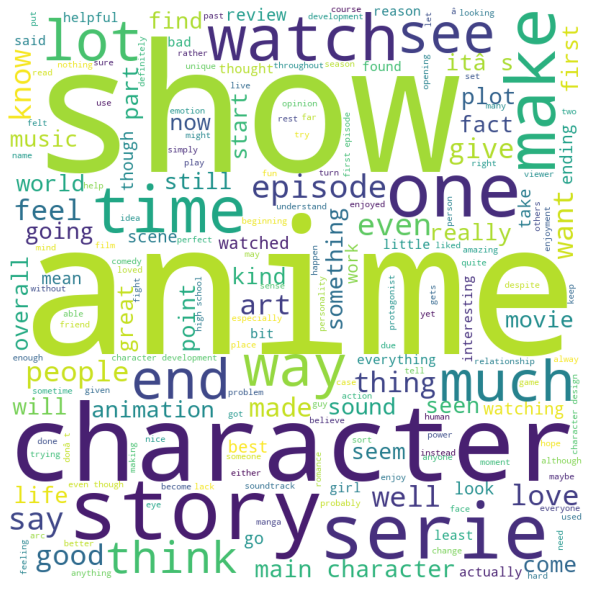

In [13]:
comment_words= ''
stopwords = set(STOPWORDS)
for val in reviews:
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### Inferences

> There are a few **insights from a set of words that I think we can derive from this wordcloud:
> 
> * Words like **_character_**, **_enjoyed_**, **_felt_**, **_main character_**, and  **_story_** gravitate towards strong correlation between **Character Development**, **Enjoyment**, and **Story**.
>
> * **_Music_** and **_soundtrack_** attribute to the importance of the music used in anime productions.
>
> * **_Art_** and **_character design_** are some of the highlights the viewership seeks in **Animation**.
>
> * Due to the frequency of TV content, it's also noteworthy of the word **_episode_** being a mainstay point-of-note in the viewership.
<hr>

### What is the viewership's sentiment distribution?

In [31]:
fig = px.pie(df_reviews, 'attitude', hole=.2)
fig.update_layout(
    title_text="Overall Viewer Sentiment of Anime Titles Produced Between 1992 and 2018",
    )
fig.show()

#### Inferences

> * The outstanding sentiment from the viewership has been a resoundingly **Positive** one in general. This could be attributed to the "anime boom in the late 90s entering the new millenium".
>
>

#### Is there any correlation between the ranking features in anime title and the sentiment scores of each review?

Text(0.5, 1.0, 'Correlation Between Ranking Features of Anime')

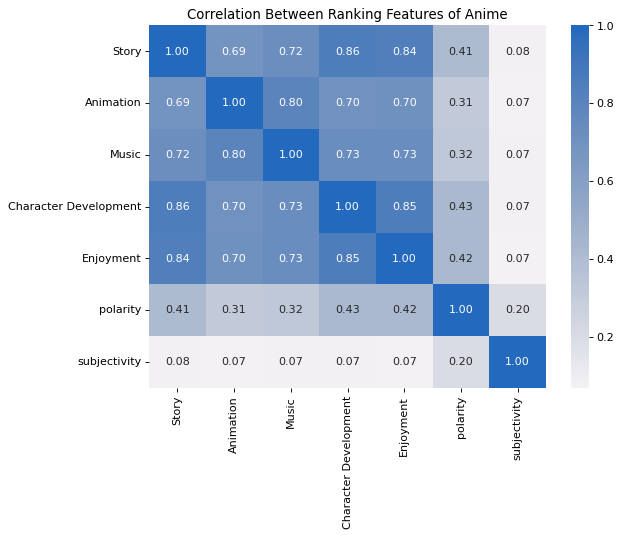

In [ ]:
plt.figure(figsize=(8, 6), dpi=80)
fig = sb.heatmap(df_reviews[['Story', 'Animation', 'Music', 'Character Development', 'Enjoyment', 'polarity', 'subjectivity']].corr(), annot=True, fmt='.2f', cmap='vlag_r', center=0)
plt.title('Correlation Between Ranking Features of Anime')

#### Inferences

> There are a number of intersting insights to be picked up from the correlation matrix plotted above. We can infer:
> * Generally, the animation, character development, enjoyment, music and story contribute highly to the final score each anime receives by the user i.e. the **Overall** score.
>
> * The _**Character Development**_ and _**Enjoyment**_ factors are the closely related to the _**Story**_ factor when users make their reviews.
> 
> * Generally, anime with a high _**Music**_ score are more likely to have good _**Animation**_.
>
> * It would right to posit that the more "human" features of anime contribute to how the reviewer watches i.e. in what scope it polarises the viewer. Consequently, the _**Character Development**_, _**Enjoyment**_ and _**Story**_ are more likely to determine whether the reviewer is left with a negative or positive sentiment at the end of the show.
<hr>

## Investigating the relationship between viewership sentiment and inherrent anime features

> The goal is to merge both datasets into one and ascertain how each of the categorizing features in the anime dataset scores when it comes to the viewers' sentiments.

In [33]:
df_anime_reviews = pd.merge(df_reviews, df_animes[['title', 'genre', 'studio', 'season_released', 'year_released',
        'type', 'source', 'episodes', 'rating']], how='inner', on='title')
df_anime_reviews

,title,text,Overall,Story,Animation,Music,Character Development,Enjoyment,polarity,subjectivity,attitude,genre,studio,season_released,year_released,type,source,episodes,rating
0,Made in Abyss,...,10.00,10,10,10,10,10,0.157887,0.571909,Positive,Sci-Fi,Kinema Citrus,Summer,2017,TV,Web manga,13,R - 17+ (violence & profanity)
1,Made in Abyss,...,0.00,0,0,0,0,0,0.148182,0.615993,Positive,Sci-Fi,Kinema Citrus,Summer,2017,TV,Web manga,13,R - 17+ (violence & profanity)
2,Made in Abyss,...,9.51,9,10,9,9,10,0.204097,0.521248,Positive,Sci-Fi,Kinema Citrus,Summer,2017,TV,Web manga,13,R - 17+ (violence & profanity)
3,Made in Abyss,...,10.00,10,10,10,8,9,0.184405,0.610298,Positive,Sci-Fi,Kinema Citrus,Summer,2017,TV,Web manga,13,R - 17+ (violence & profanity)
4,Made in Abyss,...,8.52,7,10,10,5,6,0.152582,0.520738,Positive,Sci-Fi,Kinema Citrus,Summer,2017,TV,Web manga,13,R - 17+ (violence & profanity)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121836,Amagami SS,...,7.04,8,6,7,9,9,0.185425,0.487029,Positive,Slice of Life,AIC,Summer,2010,TV,Visual novel,25,PG-13 - Teens 13 or older
121837,Amagami SS,...,8.02,8,8,8,8,9,0.411667,0.514583,Positive,Slice of Life,AIC,Summer,2010,TV,Visual novel,25,PG-13 - Teens 13 or older
121838,Amagami SS,...,8.02,7,9,9,8,8,0.243773,0.535859,Positive,Slice of Life,AIC,Summer,2010,TV,Visual novel,25,PG-13 - Teens 13 or older
121839,Amagami SS,...,9.01,9,9,9,9,9,0.174913,0.555542,Positive,Slice of Life,AIC,Summer,2010,TV,Visual novel,25,PG-13 - Teens 13 or older


<hr>

### Using the anime `title` as the unique feature in the merged dataset, I'd like to study what's the percentage distribution of sentiments for all the various titles released in the study period. 

In [49]:
values = [len(set(df_anime_reviews[df_anime_reviews.attitude == "Positive"].title)),
len(set(df_anime_reviews[df_anime_reviews.attitude == "Negative"].title)),
len(set(df_anime_reviews[df_anime_reviews.attitude == "Neutral"].title))]

names = ['Postive sentiments', 'Negative sentiments', 'Neutral sentiments']

fig = px.pie(names=names, values=values, title='Percentage Distribution of Titles Receiving Various Sentiments (1992 - 2018)')
fig.update_layout(legend=dict(
    orientation="v",
    title_text='Titles that received',
    yanchor="bottom",
    y=0.5,
    xanchor="right",
    x=0.85
))

#### Inferences

> * It's fair to say that the positive outlook on most titles slightly outweighs the volume of anime titles receiving negative criticisms. 
<hr>

### What is the trend in the viewership's `Overall` score and `Polarity` based on various anime `ratings` and `genres`?

In [50]:
fig = px.scatter(df_anime_reviews, x="Overall", y="polarity", color="genre", facet_col="rating", height=600, width=3000, 
                 color_discrete_sequence=px.colors.qualitative.Dark24, labels={'genre':'Genre'},
                 facet_col_wrap=4)
fig.show()

#### Inferences
 
> * When it comes to anime curated for Children i.e. G and PG-rated content, **Adventure** seems to the standout genre scoring highly in the **Overall** and generally **Positive** reactions. 
>
> * **Action**, **Comedy** and **Slice of Life** content is highly popular among the PG-13 demographic.
> 
> * **Action**, **Comedy**, **Psychological** genres tend to perform well in the adult-rated anime. While some of this content may be curated for older audiences and could score highly on the **Overall** factor, certain titles can leave a **Negative** sentiment on the viewership.
>
> * While content centered around nudity i.e. **Hentai** might score **highly in the Overall** department, there is still a general **Negative** outlook on this genre.
<hr>

### What has been the trend in sentiments given over the years?

In [ ]:
df_anime_reviews.groupby(['year_released', 'attitude'])['title'].count().reset_index()

,year_released,attitude,title
0,1992,Negative,2
1,1992,Neutral,0
2,1992,Positive,56
3,1993,Negative,0
4,1993,Neutral,0
...,...,...,...
76,2017,Neutral,7
77,2017,Positive,7606
78,2018,Negative,526
79,2018,Neutral,3


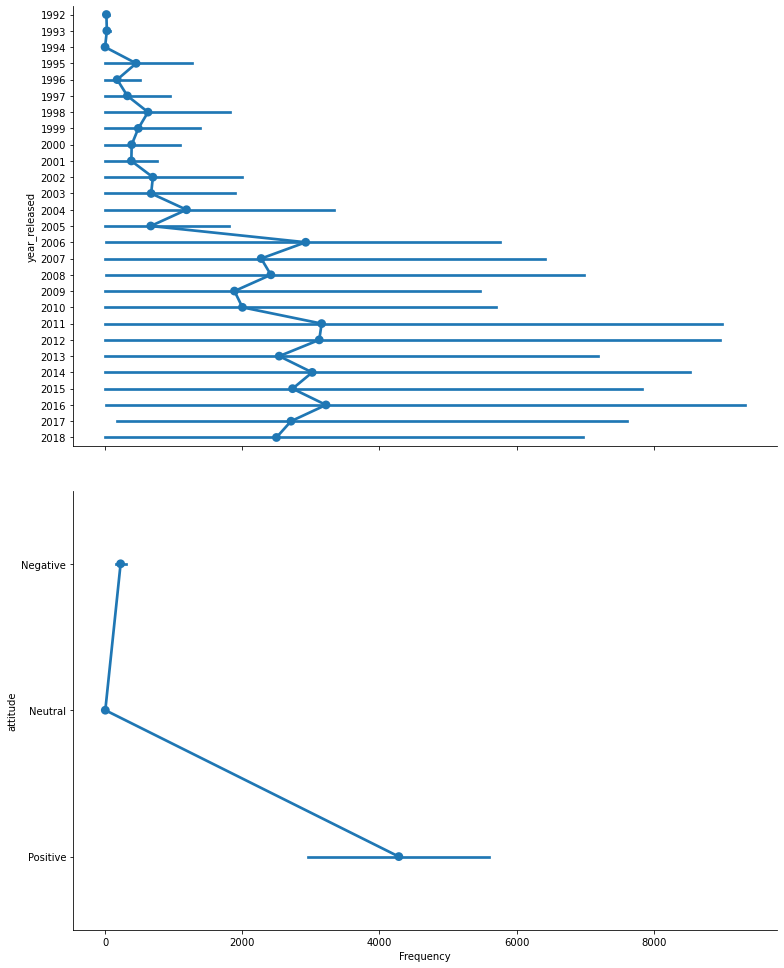

In [ ]:
g= sb.PairGrid(data = df_anime_reviews.groupby(['year_released', 'attitude'])['title'].count().reset_index(),
                x_vars='title', y_vars=['year_released', 'attitude'])
g.map(sb.pointplot)
plt.xlabel('Frequency')
g.fig.set_size_inches(15,15)


#### Inferences

> * There has been a steady increase in the number of reviews given for anime over the years with the number of **Positive** sentiments heavily outweighing the other two scopes of feeling.
<hr>

### What has been the trend in overall attitude in the anime industry viewership?

In [ ]:
fig = px.line(df_anime_reviews.groupby(['year_released', 'attitude'])['title'].count().reset_index(), 
        x='year_released', y='title', color='attitude', color_discrete_sequence=['red', 'blue', 'green'],
        labels={'year_released':'Year Released', 'title':'Count', 'attitude':'Attitude'} ,orientation='v')
fig.show()

In [358]:
df_anime_reviews.query('year_released == 2006 and attitude == "Positive"').title.value_counts().head(10)

Death Note                         1682
Code Geass: Hangyaku no Lelouch     914
NHK ni Youkoso!                     558
Ouran Koukou Host Club              524
Higurashi no Naku Koro ni           510
Suzumiya Haruhi no Yuuutsu          404
Nana                                366
Gintama                             362
Katekyo Hitman Reborn!              358
Black Lagoon                        316
Name: title, dtype: int64

In [357]:
top2006 =  df_anime_reviews.query('year_released == 2006 and attitude == "Positive"').title.value_counts().head(10).index.to_list()
df_animes.query('title in @top2006')

,anime_id,title,genre,studio,season_released,year_released,type,source,episodes,status,...,image_url,rating,score,scored_by,score_rank,popularity,popularity_rank,members,favorites,avg_rank_score
2,1575,Code Geass: Hangyaku no Lelouch,Action,Sunrise,Fall,2006,TV,Original,25,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.79,627740,22.0,9,9.0,986897,63614,15.5
4,1535,Death Note,Mystery,Madhouse,Fall,2006,TV,Manga,37,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.67,1009477,31.0,1,1.0,1456378,88696,16.0
36,918,Gintama,Action,Sunrise,Spring,2006,TV,Manga,201,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,PG-13 - Teens 13 or older,9.01,141830,11.0,95,92.0,459031,33781,51.5
56,853,Ouran Koukou Host Club,Comedy,Bones,Spring,2006,TV,Manga,26,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,PG-13 - Teens 13 or older,8.34,335137,62.0,69,68.0,538843,24072,65.0
80,849,Suzumiya Haruhi no Yuuutsu,Comedy,Kyoto Animation,Spring,2006,TV,Light novel,14,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,PG-13 - Teens 13 or older,7.99,304612,97.0,68,67.0,542064,13966,82.0
92,889,Black Lagoon,Action,Madhouse,Spring,2006,TV,Manga,12,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.13,233227,83.0,98,95.0,449033,9708,89.0
95,934,Higurashi no Naku Koro ni,Mystery,Studio Deen,Spring,2006,TV,Visual novel,26,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R - 17+ (violence & profanity),8.10,221985,86.0,97,94.0,452086,15819,90.0
99,1210,NHK ni Youkoso!,Comedy,Gonzo,Summer,2006,TV,Novel,24,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R+ - Mild Nudity,8.38,189128,58.0,132,125.0,384164,15923,91.5
136,1604,Katekyo Hitman Reborn!,Action,Artland,Fall,2006,TV,Manga,203,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,PG-13 - Teens 13 or older,8.31,145865,65.0,173,163.0,332312,13899,114.0
189,877,Nana,Music,Madhouse,Spring,2006,TV,Manga,47,Finished Airing,...,https://myanimelist.cdn-dena.com/images/anime/...,R+ - Mild Nudity,8.51,108693,45.0,262,237.0,262266,12291,141.0


#### Inferences

> * Generally the anime industry has had a **steadily increasing Positive** outlook since the turn of the 21st Century.
>
> * **Neutral** outlooks haven't had the most traction and are also outweighed by **Negative** sentiments.
>
> * **Positive viewership reviews had the biggest bump in 2006**. Notably this was the year that popular releases like Madhouse's **Death Note** and **Black Lagoon**, Sunrise's **Code Geass: Rebellion of Lelouch** and **Gintama** aired.
>
> * Majority of these titles were **Action titles**, **sourced from manga**, **aired via TV** and **released in Spring**. These titles were either **R-rated** or **PG-13 rated**.
<hr>

### What's the overall sentiment shift as the seasons pass by?

In [ ]:
fig = px.line(df_anime_reviews.groupby(['season_released', 'attitude'])['title'].count().reset_index(), 
        x='season_released', y='title', color='attitude', color_discrete_sequence=['red', 'blue', 'green'],
        orientation='v', labels={'season_released':'Season Released', 'title':'Count', 'attitude':'Attitude'},
        title='Sentiment Change over Seasonal Anime Releases')
fig.show()

#### Inferences:

> * **Spring** and **Fall** releases tend to receive the highest number of **Positive** reviews compared to the other two seasons.
>
> * There's a general drop in the number of **Positive** reviews during the **Winter** release period.

> <hr>

### What's the highest cumulative attitude per genre as the years progressed (1992 - 2018)?

In [368]:
df_anime_reviews.year_released = df_anime_reviews.year_released.astype('category')

In [386]:
fig = px.histogram(df_anime_reviews, x='attitude', color='genre', facet_col='year_released',
                   facet_col_wrap=4, height= 3500, width=1000,
                   category_orders={"year_released": np.arange(1992, 2019)},
                   labels={'year_released':'Year Released', 'genre':
                   'Genres', 'attitude':'Attitude'})
fig.show()


#### Inferences

> * **Action** anime has been popular since the 90s while **Comedy** and **Slice of Life** genres picked up in the 2000s with 2008 being the peak year for the latter genre.
<hr>

### On average, what are user sentiments and scores for each season?

In [387]:
df_review_seasons = df_anime_reviews.groupby(['season_released', 'attitude'])[['Overall', 'Story', 'Animation', 'Music',
       'Character Development', 'Enjoyment', 'polarity', 'subjectivity']].mean()

df_review_seasons

Overall     Story  Animation     Music  \
season_released attitude                                            
Spring          Negative  5.377199  4.636364   6.122449  5.954855   
                Neutral   8.106667  8.238095   7.952381  8.333333   
                Positive  7.736924  7.473683   7.968442  7.942266   
Summer          Negative  5.031984  4.231439   5.841067  5.624710   
                Neutral   7.215000  7.000000   7.388889  8.000000   
                Positive  7.582179  7.224383   7.907943  7.750890   
Fall            Negative  5.160242  4.393537   5.930756  5.716099   
                Neutral   7.789512  7.609756   7.951220  8.146341   
                Positive  7.800464  7.563962   8.005487  7.979160   
Winter          Negative  5.116238  4.229367   6.012476  5.682342   
                Neutral   7.520769  6.538462   8.461538  7.923077   
                Positive  7.486709  7.061965   7.879711  7.712244   

                          Character Development  Enjoyment  polarity  \
season_released attitude                                               
Spring          Negative               4.465059   4.636364 -0.062796   
                Neutral                7.619048   8.095238  0.000000   
                Positive               7.726856   7.973371  0.183457   
Summer          Negative               3.966357   4.372390 -0.065605   
                Neutral                7.388889   7.555556  0.000000   
                Positive               7.338335   7.714986  0.174297   
Fall            Negative               4.323716   4.332372 -0.064407   
                Neutral                7.902439   6.902439  0.000000   
                Positive               7.772586   7.987197  0.184682   
Winter          Negative               4.276392   4.344530 -0.065508   
                Neutral                6.769231   6.461538  0.000000   
                Positive               7.356122   7.619875  0.174380   

                          subjectivity  
season_released attitude                
Spring          Negative      0.551851  
                Neutral       0.244778  
                Positive      0.534497  
Summer          Negative      0.550851  
                Neutral       0.176455  
                Positive      0.534080  
Fall            Negative      0.551066  
                Neutral       0.259838  
                Positive      0.536410  
Winter          Negative      0.557510  
                Neutral       0.322768  
                Positive      0.532933

#### Inferences

> From this subset of data, we can observe certain opinions about the viewership about the seasons. 
> * The viewership looks forward to **Fall releases the most** given their comparitive **Positive** sentiment scores.
>
> * Seemingly, **Summer** anime releases have been noted to have the **lowest quality of animation**.
>

### What are the leading studios in terms of each of the viewership's two main attitudes?

In [54]:
studio_sentiments = df_anime_reviews.groupby(['studio', 'attitude'])['polarity'].count().reset_index()
studio_sentiments.rename(columns={'polarity':'count'}, inplace=True)
display(studio_sentiments.query('attitude == "Positive"').sort_values('count', ascending=False).head(10),  studio_sentiments.query('attitude == "Negative"').sort_values('count', ascending=False).head(10))

,studio,attitude,count
127,Madhouse,Positive,11796
114,Kyoto Animation,Positive,7465
4,A-1 Pictures,Positive,6854
44,Bones,Positive,6722
103,J.C.Staff,Positive,5933
246,Sunrise,Positive,4873
237,Studio Pierrot,Positive,4745
282,White Fox,Positive,4425
168,Production I.G,Positive,4124
46,Brain&#039;s Base,Positive,3197


### How does the viewer attribute the studios? A look at the top-rated studios on each ranking feature.

In [ ]:
df_review_studios = df_anime_reviews.groupby(['studio'])[['Overall', 'Story', 'Animation', 'Music',
       'Character Development', 'Enjoyment', 'polarity', 'subjectivity']].mean()

df_review_studios.sort_values('Overall',ascending=False).head(20)

,Overall,Story,Animation,Music,Character Development,Enjoyment,polarity,subjectivity
studio,,,,,,,,
CoMix Wave Films,8.554220,7.795265,9.288301,8.616992,7.662953,8.378830,0.221565,0.537666
Oh! Production,8.462075,8.584906,8.320755,8.584906,8.169811,8.830189,0.176396,0.503955
"Xebec, AIC",8.300385,7.884615,8.692308,8.230769,8.115385,8.153846,0.176022,0.544515
Kinema Citrus,8.284678,8.117517,8.425721,8.361419,8.048780,8.425721,0.198210,0.551625
"Studio Gallop, Studio Deen",8.265488,8.426829,8.073171,8.195122,8.682927,8.463415,0.186307,0.511361
SynergySP,8.233538,8.630769,7.800000,8.369231,8.876923,8.676923,0.172978,0.499269
Studio Chizu,8.212956,7.879562,8.514599,8.215328,8.127737,8.124088,0.205241,0.548068
Studio Rikka,8.205072,8.086957,8.289855,7.710145,8.101449,8.507246,0.190594,0.512029
Studio Gallop,8.203699,8.630137,7.739726,8.424658,9.164384,8.863014,0.212883,0.545670


In [411]:
def leader(df, stats=[]):
    for stat in stats:
        print(f'The best ranked in terms of {stat} is', df.nlargest(1, stat).index[0])

stats = ['Overall', 'Story', 'Animation', 'Music', 'Character Development', 'Enjoyment', 'polarity']
leader(df_review_studios, stats)

The best ranked in terms of Overall is CoMix Wave Films
The best ranked in terms of Story is SynergySP
The best ranked in terms of Animation is Square Enix
The best ranked in terms of Music is Tezuka Productions, MAPPA
The best ranked in terms of Character Development is Studio Gallop
The best ranked in terms of Enjoyment is Studio Gallop
The best ranked in terms of polarity is Group TAC


<hr>

In [ ]:
fig = px.imshow(df_review_studios[['Story', 'Animation', 'Music', 'Character Development',
       'Enjoyment', 'polarity', 'subjectivity']].corr(), color_continuous_scale='icefire', width=1000, height=800, title='Relationship between Features of Anime as Ranked by Audiences', text_auto='.2f')
fig.show()

#### Inferences

> * **Character Development** and **Enjoyment** have a strong correlation with the outcome of the **Story** score. If an anime does not deliever on the two former features, it's highly likely that it will score quite poorly on the **Story** factor.
>
> * **Animation** and **Music** go hand in hand to a certain degree. This explains why certain action scenes in anime could go for fast-paced upbeat tunes while emotive scenes would require songs along the melancholic to poignant scale.
>
> * The outstanding sentiment left on a viewer could be highly influenced by how the anime scores in the **Character Development** and **Enjoyment** feature. 
<hr>

### What's the trend of viewership scores across the various genres?

In [ ]:
df_review_genres = df_anime_reviews.groupby(['genre'])[['Overall', 'Story', 'Animation', 'Music',
       'Character Development', 'Enjoyment', 'polarity', 'subjectivity']].mean()

df_review_genres.sort_values('Overall',ascending=False).head(20)

,Overall,Story,Animation,Music,Character Development,Enjoyment,polarity,subjectivity
genre,,,,,,,,
Supernatural,8.554220,7.795265,9.288301,8.616992,7.662953,8.378830,0.221565,0.537666
Thriller,8.530334,8.801027,8.236200,8.322208,8.671374,8.698331,0.179870,0.533792
Music,8.122982,8.029821,8.188867,8.761431,8.330020,8.439364,0.189478,0.534107
Josei,7.948255,8.053691,7.812081,7.765101,8.416107,8.536913,0.214263,0.540029
Horror,7.887983,7.571429,8.168067,7.991597,7.445378,7.873950,0.176428,0.535944
Mystery,7.843233,7.672629,7.985973,7.923948,7.573285,7.873633,0.158716,0.541203
Slice of Life,7.836885,7.547418,8.095035,7.954082,7.925492,8.010996,0.185046,0.542808
Romance,7.820744,7.554804,8.057510,8.023681,7.808525,7.807172,0.172400,0.531631
Game,7.683770,7.370252,7.965614,7.717313,7.363055,7.864454,0.157489,0.527131


In [412]:
stats = ['Overall', 'Story', 'Animation', 'Music', 'Character Development','Enjoyment', 'polarity', 'subjectivity']
leader(df_review_genres, stats)

The best ranked in terms of Overall is Supernatural
The best ranked in terms of Story is Thriller
The best ranked in terms of Animation is Supernatural
The best ranked in terms of Music is Music
The best ranked in terms of Character Development is Thriller
The best ranked in terms of Enjoyment is Thriller
The best ranked in terms of polarity is Supernatural
The best ranked in terms of subjectivity is Hentai


#### Inferences

> * The **Thriller** and **Supernatural** genres stand out as having the highest average ratings for most features reviewed by the viwership.
<hr>

### How are viewership ratings affected across various release formats?

In [ ]:
df_review_type = df_anime_reviews.groupby(['type'])[['Overall', 'Story', 'Animation', 'Music',
       'Character Development', 'Enjoyment']].mean()

fig = px.bar(df_review_type.sort_values('Overall',ascending=False), text='value', text_auto='.1f',
              title='Feature Scores across Various Anime Release Formats',
              labels={'value':'Score', 'type':'Release Format', 'variable':'Features'})
fig.update_layout(barmode='stack')

#### Inferences

> * There is a general preference by the viewership in terms of how **Movie** releases flesh out the **Overall** component of each anime title. 
>
> * **Movie** and, *surprisingly*, **Music** releases tend to have the best-looking **Animation** according to the viewership. However, the latter scores quite lowly in terms of **Character Development** due it such videos being 3-5 minute snippets. Personally, I highly reccommend some of Eve's or n-buna/Yorushika's works.
>
> * **OVAs** are the least favoured kind of releases based on the viewership's preferences.
<hr>

### How are viewership scores affected anime viewing ratings?

In [ ]:
df_review_rating = df_anime_reviews.groupby(['rating'])[['Overall', 'Story', 'Animation', 'Music',
       'Character Development', 'Enjoyment']].mean()

fig = px.bar(df_review_rating.sort_values('Overall',ascending=False), text='value', text_auto='.1f',
            labels={'rating': 'Rating', 'value':'Score', 'variable':'Scoring Feature'},
            title='Scores across Various Features and Genres')
fig.update_layout(barmode='stack')

### Inferences

> * It is intersting to note that, *according to the viewership*, the **Overall satisfaction factor decreases the more profane/provocative the content gets**.
<hr>